# Bohm

In [1]:
suppressPackageStartupMessages({
    library(Matrix)
    library(scater)
    library(Seurat)
    library(data.table)
    library(cowplot)
    library(dplyr)
})

Warning message:
“replacing previous import ‘BiocGenerics::dims’ by ‘Biobase::dims’ when loading ‘SummarizedExperiment’”Warning message:
“replacing previous import ‘Biobase::dims’ by ‘DelayedArray::dims’ when loading ‘SummarizedExperiment’”

In [2]:
packageVersion("Seurat")

[1] ‘3.1.1’

## Loading the data

Import the `SingleCellExperiment` object made in the `scater` notebook.

In [3]:
osx <- readRDS(file = "Bohm.Rds")
dim(osx)

[1] 27343   168

## Data preprocessing

### Importing and apppending the metadata

In [7]:
osx.metadata <- read.table(file = "Bohm_metadata.tsv", sep = "\t", row.names = 1)
colnames(osx.metadata) <- c("Origin", "CellType", "Organism", "Tech")
head(osx.metadata, 5)

,Origin,CellType,Organism,Tech
,<fct>,<fct>,<fct>,<fct>
ERR3427950,Tibia,Osx-GFP+,Mouse,SMART-Seq2
ERR3427951,Tibia,Osx-GFP+,Mouse,SMART-Seq2
ERR3427952,Tibia,Osx-GFP+,Mouse,SMART-Seq2
ERR3427953,Tibia,Osx-GFP+,Mouse,SMART-Seq2
ERR3427954,Tibia,Osx-GFP+,Mouse,SMART-Seq2


In [8]:
osx <- AddMetaData(osx, osx.metadata)

In [9]:
osx@meta.data[1:5, 1:5]

,Cells,Origin,CellType,Organism,Tech
,<fct>,<fct>,<fct>,<fct>,<fct>
ERR3427950,ERR3427950,Tibia,Osx-GFP+,Mouse,SMART-Seq2
ERR3427951,ERR3427951,Tibia,Osx-GFP+,Mouse,SMART-Seq2
ERR3427952,ERR3427952,Tibia,Osx-GFP+,Mouse,SMART-Seq2
ERR3427953,ERR3427953,Tibia,Osx-GFP+,Mouse,SMART-Seq2
ERR3427954,ERR3427954,Tibia,Osx-GFP+,Mouse,SMART-Seq2


## Normalisation

In [10]:
osx <- NormalizeData(object = osx, 
                     normalization.method = "LogNormalize", 
                     scale.factor = 10000)

In [11]:
osx <- FindVariableFeatures(object = osx, mean.function = ExpMean, 
                            dispersion.function = LogVMR)

When using repel, set xnudge and ynudge to 0 for optimal results


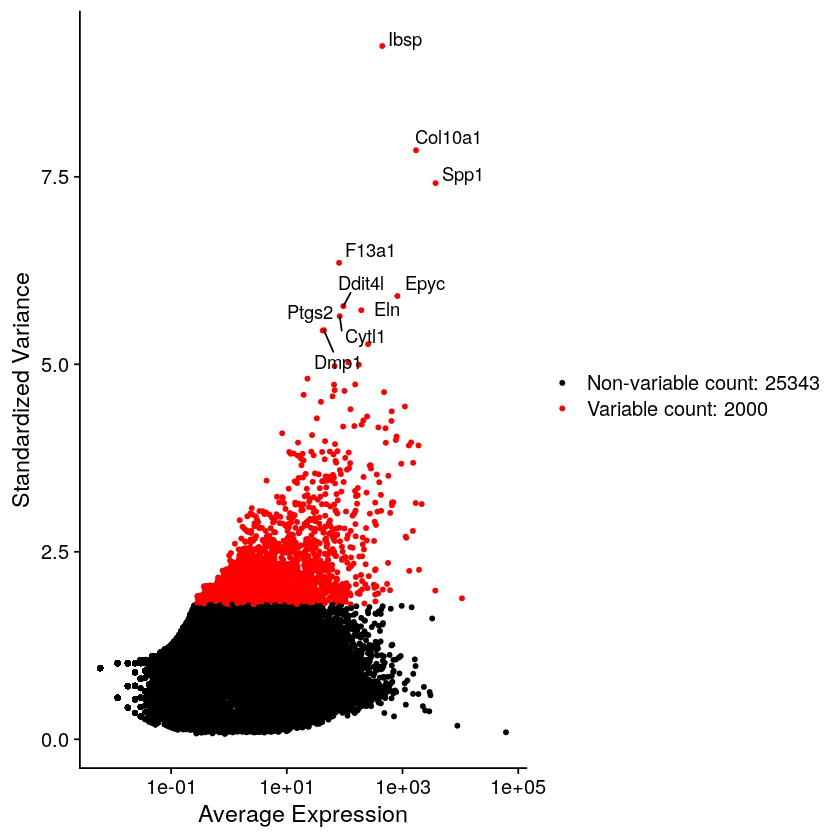

In [12]:
top10 <- head(VariableFeatures(osx), 10)

plot1 <- VariableFeaturePlot(osx)
plot2 <- LabelPoints(plot = plot1, points = top10, repel = TRUE)
plot2

## Scaling the data

Next, we apply a linear transformation (‘scaling’) that is a standard pre-processing step prior to dimensional reduction techniques like PCA. The `ScaleData` function:

- Shifts the expression of each gene, so that the mean expression across cells is 0
- Scales the expression of each gene, so that the variance across cells is 1
    This step gives equal weight in downstream analyses, so that highly-expressed genes do not dominate
- The results of this are stored in osx[["RNA"]]@scale.data

### Regressing out latent variables: %Mito and nUMI

In [13]:
mito.genes <- grep(pattern = "mt-", x = rownames(x = GetAssayData(object = osx)), value = TRUE)
percent.mito <- Matrix::colSums(GetAssayData(object = osx)[mito.genes, ])/Matrix::colSums(GetAssayData(object = osx, slot = "counts")) * 100

In [14]:
osx <- AddMetaData(object = osx, 
                   metadata = percent.mito,
                   col.name = "percent.mito")

In [15]:
# linear regression model
all.genes <- rownames(osx)
osx.lin <- ScaleData(osx, features = all.genes, vars.to.regress = c("percent.mito", "nCount_RNA"))

Regressing out percent.mito, nCount_RNA
Centering and scaling data matrix


In [16]:
osx.negbinom <- ScaleData(object = osx, 
                          features = all.genes, 
                          vars.to.regress = c("percent.mito", "nCount_RNA"),
                          model.use = "negbinom")

Regressing out percent.mito, nCount_RNA
Warning message:
“glm.fit: algorithm did not converge”Warning message:
“glm.fit: fitted rates numerically 0 occurred”Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”War

## Dimensionality reduction

In [17]:
osx.lin <- RunPCA(object = osx.lin, pc.genes = VariableFeatures(object = osx))
osx.negbinom <- RunPCA(object = osx.negbinom, pc.genes = VariableFeatures(object = osx))

PC_ 1 
Positive:  Col1a1, Postn, Col3a1, Aspn, Ptn, Mfap4, Lgals1, Thbs2, Col8a2, Bgn 
	   Ogn, Fstl1, Serpinf1, Tpm1, Tubb5, Cdh11, Olfml3, Igfbp4, Zfhx4, Csrp2 
	   Col12a1, Tmem119, Crabp1, Col14a1, Fbn2, Tspan7, Ctsk, Ptprv, Crabp2, Cemip2 
Negative:  Hapln1, Col11a2, Col2a1, Comp, Snorc, Col9a1, Lgals3, Col9a3, Col9a2, Matn1 
	   Cnmd, Sdc4, Ncmap, Matn3, Cspg4, Panx3, Fbln7, Fam180a, Ugdh, Pcolce2 
	   Susd5, Smpd3, Acan, 4930523C07Rik, Itih5l-ps, Gale, Klhl13, Trpv4, Foxa3, Scin 
PC_ 2 
Positive:  Spp1, Ddit4l, F13a1, Ibsp, Fam20c, Steap4, Phex, Col10a1, Dmp1, Serpini1 
	   Serpine2, Tcim, Tmsb4x, Frmd4b, Anxa3, Mmp13, Jam2, Itga2, Slc29a1, Hpgd 
	   Emb, Insig2, Itm2b, Tspan13, Gm42793, Sulf1, Arap2, Spint2, St3gal1, Irx5 
Negative:  C1qtnf3, Bcat1, Fibin, Nid2, Scrg1, Rcn1, Slc16a3, Mest, P4ha1, Tgfbi 
	   Ppa1, Epyc, Ctsz, Papss2, Car12, Rtl3, Meltf, Chst11, Penk, H2-DMa 
	   H2-DMb1, S100b, Chrdl1, Sparcl1, Ccn1, Atoh8, Snai1, Pygl, Slc44a2, Gfod1 
PC_ 3 
Positive:  Aurkb, M

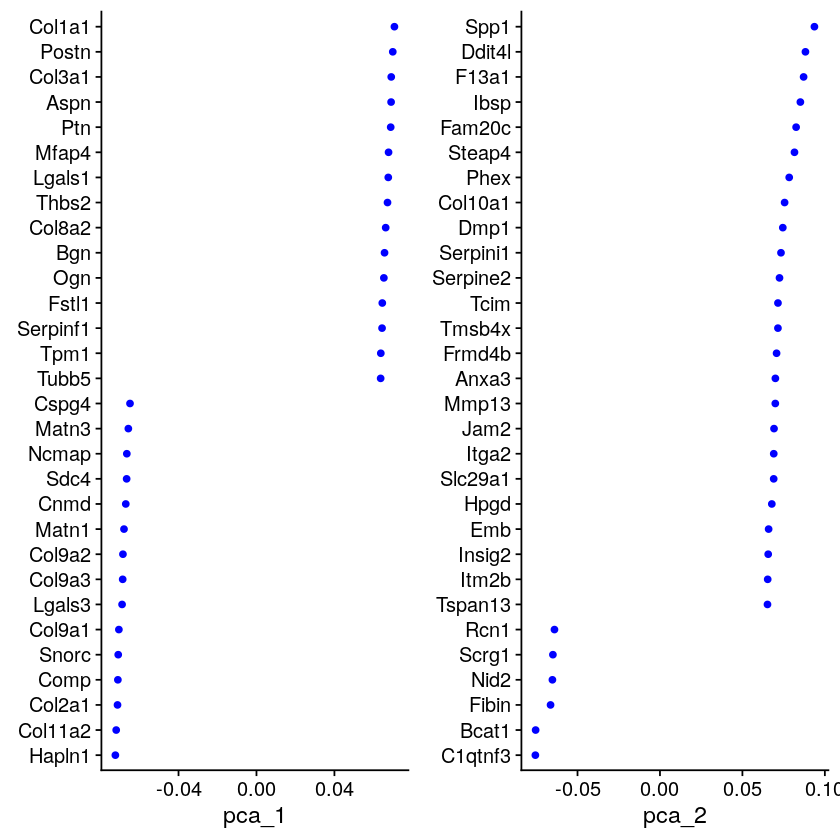

In [18]:
VizDimLoadings(osx.lin, dims = 1:2, reduction = "pca")

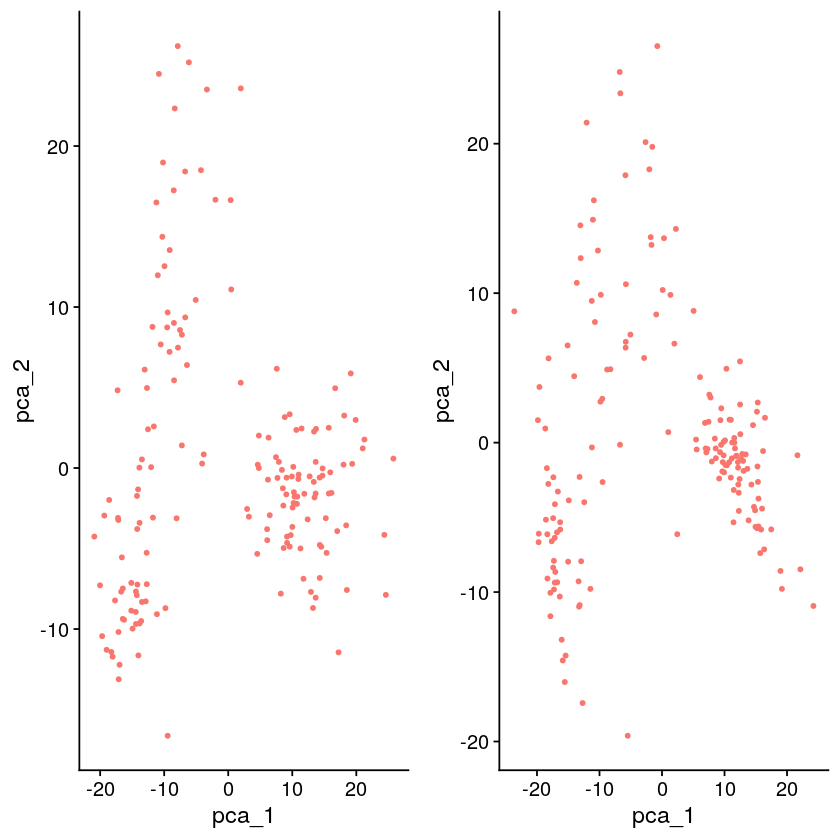

In [19]:
p1 <- DimPlot(osx.lin, reduction = "pca") + NoLegend()
p2 <- DimPlot(osx.negbinom, reduction = "pca") + NoLegend()

plot_grid(p1, p2)

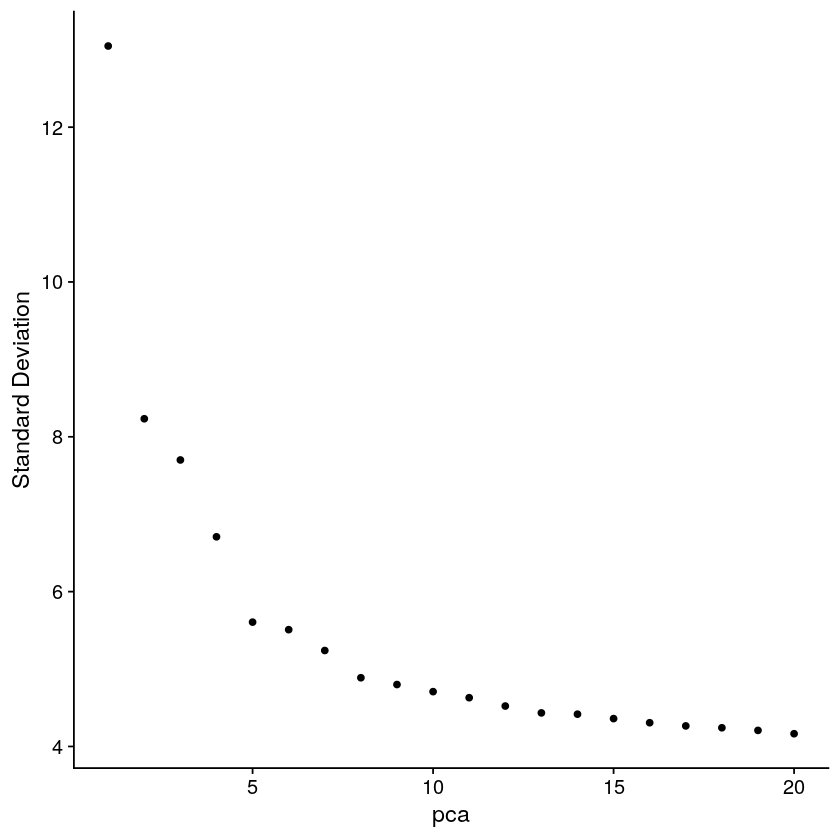

In [20]:
ElbowPlot(osx.negbinom)

## Clustering

The stochastic sampling of counts can be modeled using a Gamma-Poisson distribution, more colloquially known as the ‘negative binomial’ distribution. This is why in my opinion the negative binomial distribution better reflects random gene expression sampling.

In [26]:
osx <- FindNeighbors(osx.negbinom, dims = 1:11)
osx <- FindClusters(osx, resolution = 0.5)

Computing nearest neighbor graph
Computing SNN


Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 168
Number of edges: 4671

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7248
Number of communities: 3
Elapsed time: 0 seconds


## Non-linear dimensionality reduction

In [27]:
osx <- RunTSNE(osx, dims = 1:11)
osx <- RunUMAP(osx, dims = 1:11)

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”10:02:12 Read 168 rows and found 11 numeric columns
10:02:12 Using Annoy for neighbor search, n_neighbors = 30
10:02:12 Building Annoy index with metric = cosine, n_trees = 50
0%   10   20   30   40   50   60   70   80   90   100%
[----|----|----|----|----|----|----|----|----|----|
**************************************************|
10:02:12 Writing NN index file to temp file /tmp/Rtmp6QSQJD/file243fca4c98
10:02:12 Searching Annoy index using 1 thread, search_k = 3000
10:02:12 Annoy recall = 100%
10:02:13 Commencing smooth kNN distance calibration using 1 thread
10:02:13 Initializing from normalized Laplacian + noise
10:02:13 Commencing optimization for 500 epochs, with 5718 positive edges
10:02:14 Optimiz

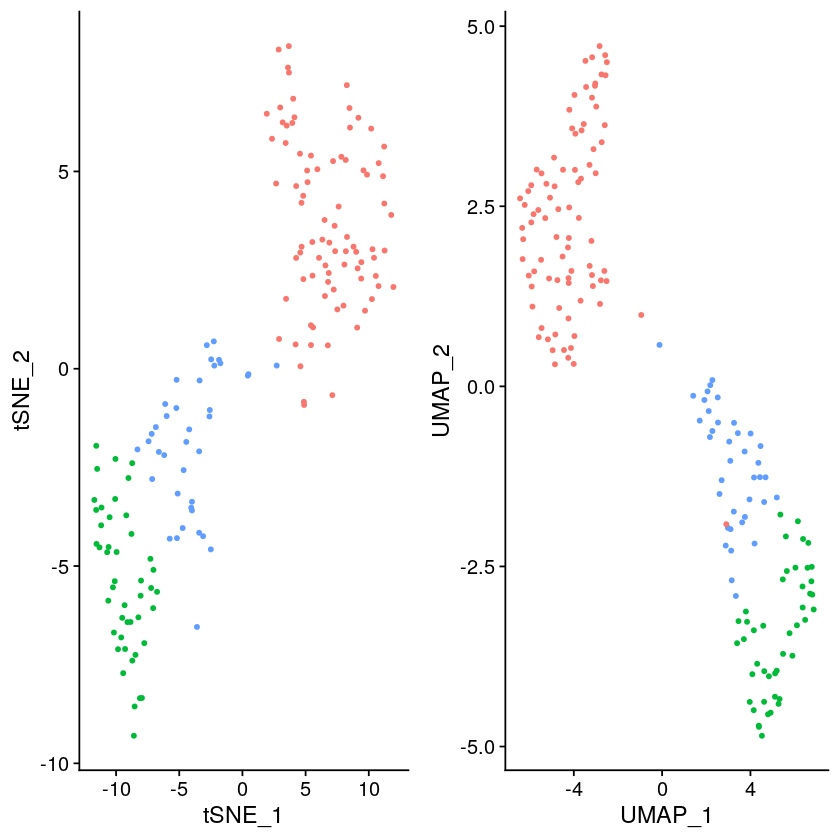

In [28]:
p1 <- DimPlot(osx, reduction = "tsne") + NoLegend()
p2 <- DimPlot(osx, reduction = "umap") + NoLegend()

plot_grid(p1, p2)

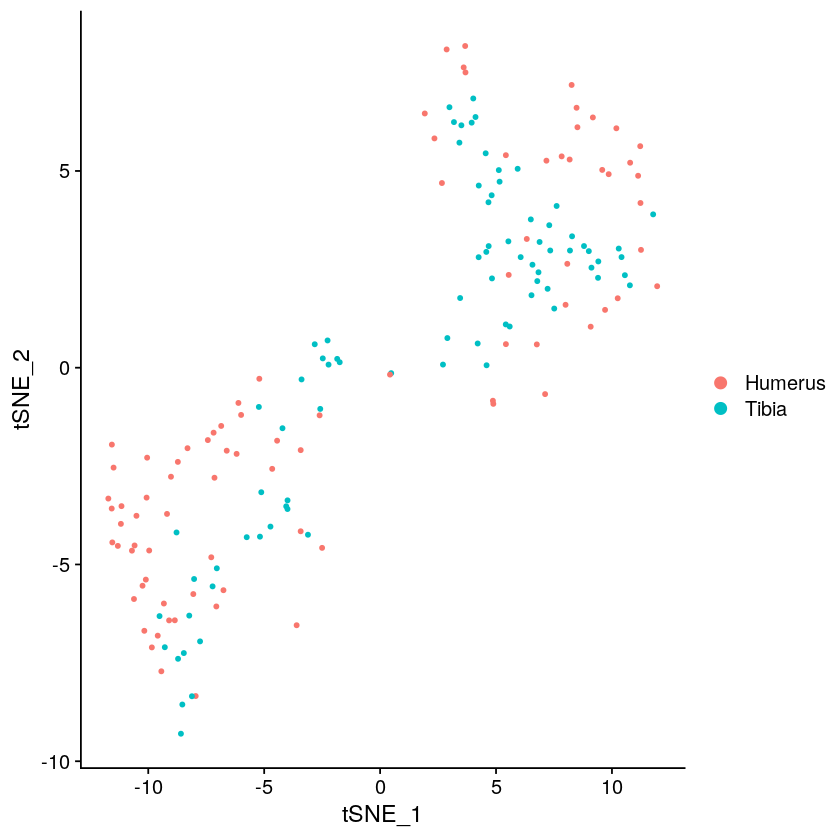

In [29]:
DimPlot(osx, reduction = "tsne", group.by = "Origin")

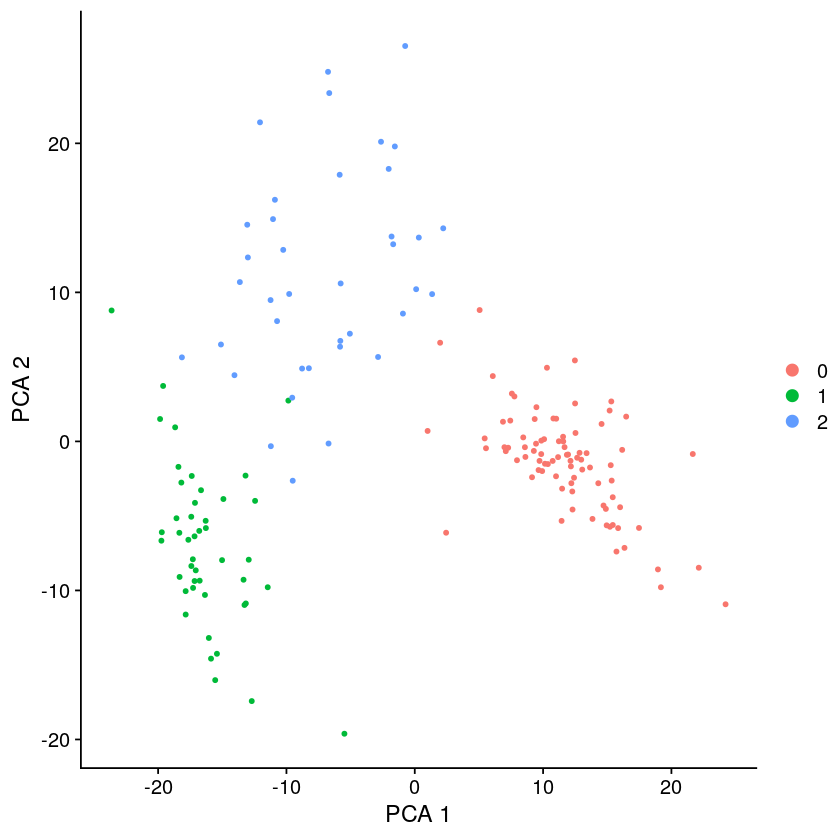

In [30]:
DimPlot(osx, reduction = "pca", group.by = "seurat_clusters") +
   xlab("PCA 1") +
   ylab("PCA 2")

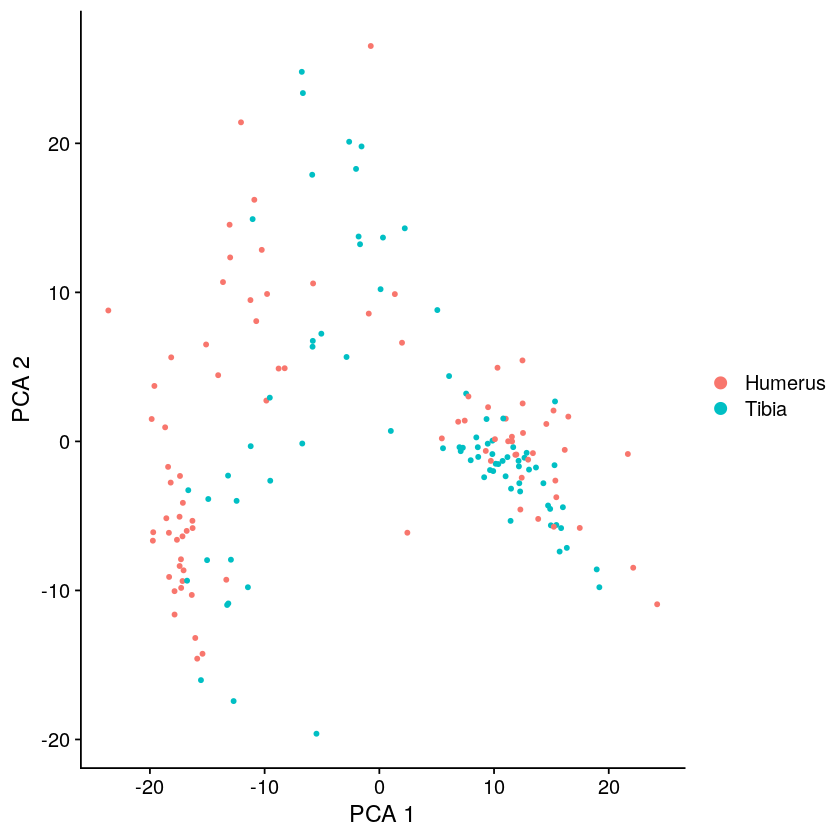

In [38]:
DimPlot(osx, reduction = "pca", group.by = "Origin") +
   xlab("PCA 1") +
   ylab("PCA 2")

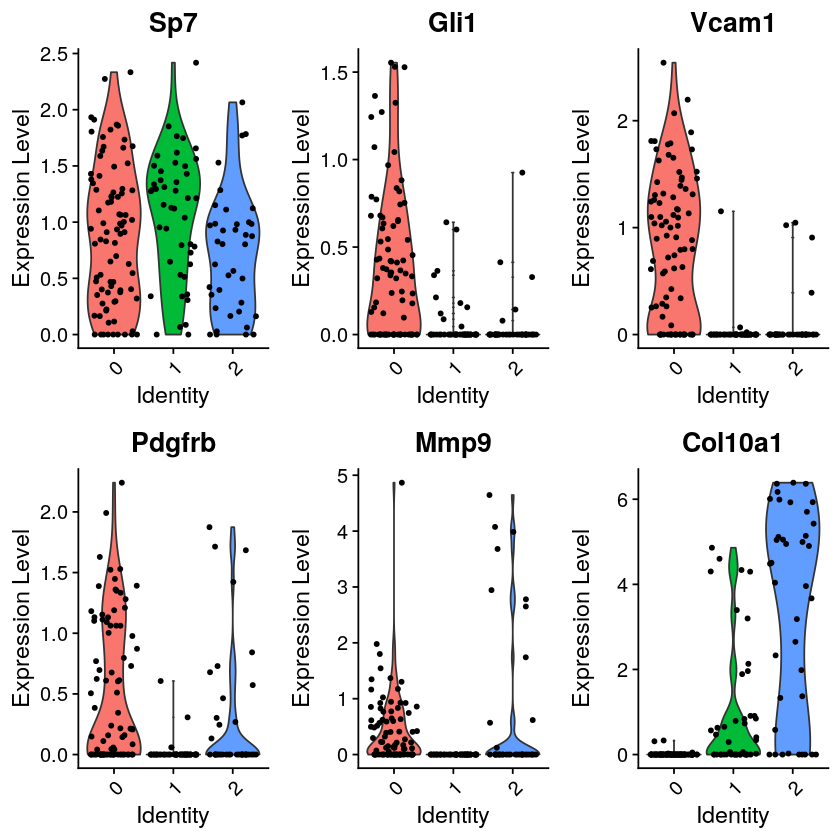

In [41]:
VlnPlot(osx, features = c("Sp7", "Gli1", "Vcam1", "Pdgfrb", "Mmp9", "Col10a1"))

Chondromodulin (Cnmd) is predominately expressed in the prehypertrophic zone of growth plate cartilage, where it promotes chondrocyte growth and inhibits angiogenesis. Its expression decreases during chondrocyte hypertrophy and vascular invasion. The mature protein likely plays a role in endochondral bone development by permitting cartilaginous anlagen to be vascularized and replaced by bone.

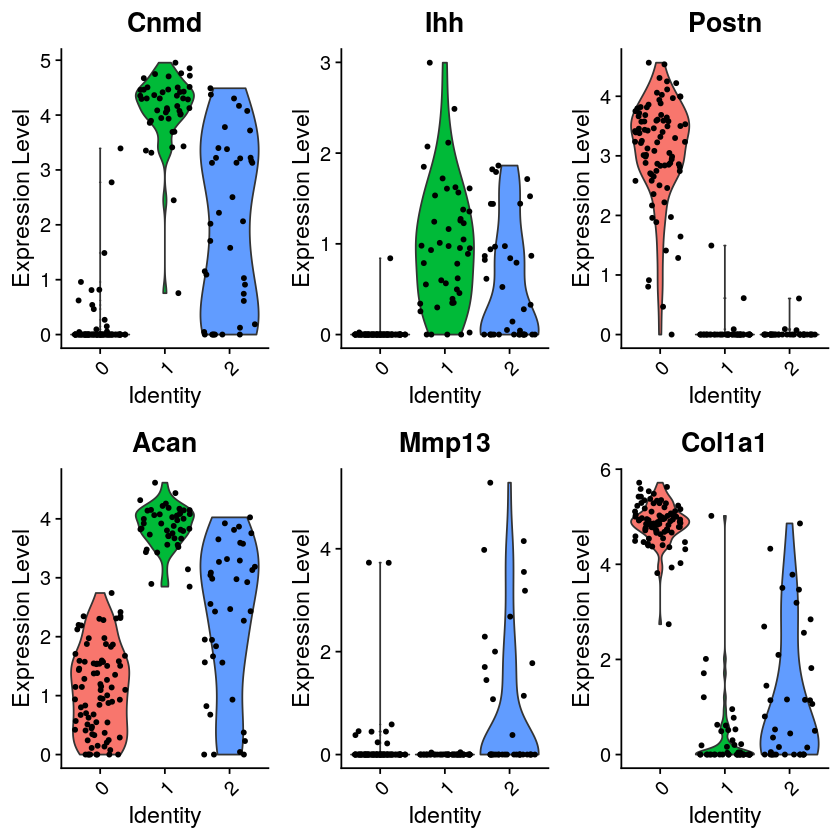

In [19]:
VlnPlot(osx, features = c("Cnmd", "Ihh", "Postn", "Acan", "Mmp13", "Col1a1"))

In [14]:
osx.markers <- FindAllMarkers(osx, only.pos = TRUE, min.pct = 0.25, logfc.threshold = 0.25)

Calculating cluster 0
Calculating cluster 1
Calculating cluster 2


In [18]:
osx.markers %>% group_by(cluster) %>% top_n(n = 5, wt = avg_logFC)

p_val,avg_logFC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
3.155498e-31,3.319957,0.988,0.072,8.628079e-27,0,Postn
5.352911e-30,2.897817,0.953,0.036,1.463646e-25,0,Aspn
3.103314e-28,2.818203,1.000,0.819,8.485391e-24,0,Col1a2
5.207843e-28,3.215620,0.988,0.566,1.423981e-23,0,Col3a1
9.419539e-28,2.880429,1.000,0.530,2.575584e-23,0,Col1a1
7.482472e-29,3.363199,0.978,0.138,2.045932e-24,1,Epyc
4.795829e-24,2.173682,1.000,0.285,1.311324e-19,1,Matn3
8.335773e-23,2.403905,1.000,0.423,2.279250e-18,1,Matn1
1.721513e-22,2.567432,1.000,0.593,4.707134e-18,1,C1qtnf3


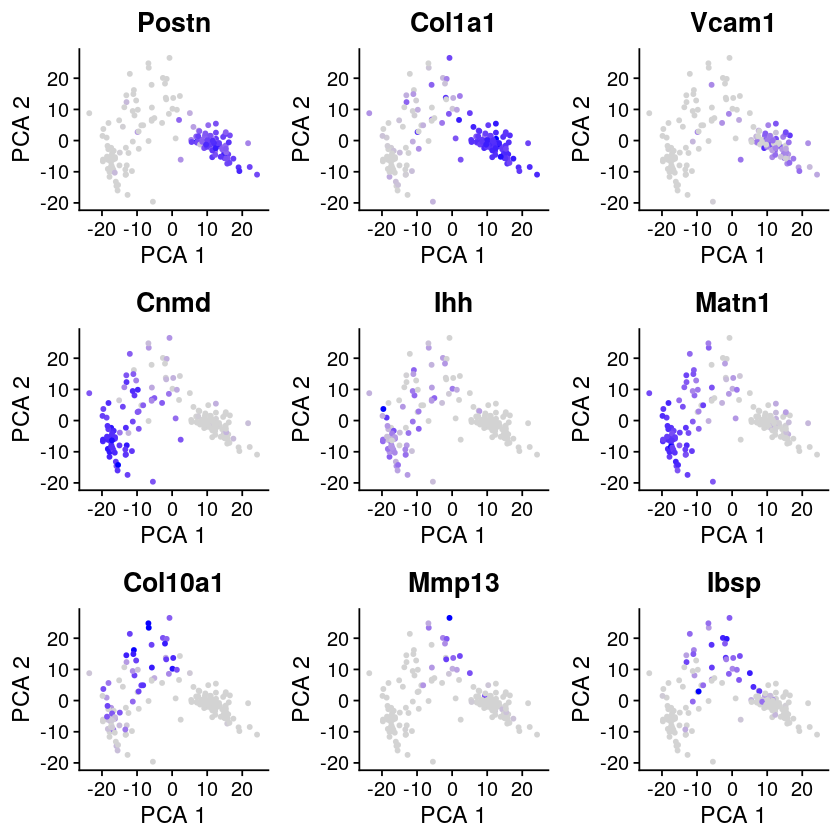

In [32]:
plots <- FeaturePlot(osx, features = c("Postn", "Col1a1", "Vcam1", 
                              "Cnmd", "Ihh", "Matn1",
                              "Col10a1", "Mmp13", "Ibsp"), 
                     reduction = "pca", combine = FALSE)
plots <- lapply(X = plots, FUN = function(p) p + xlab("PCA 1") + ylab("PCA 2") + theme(legend.position = "none") )
CombinePlots(plots = plots)

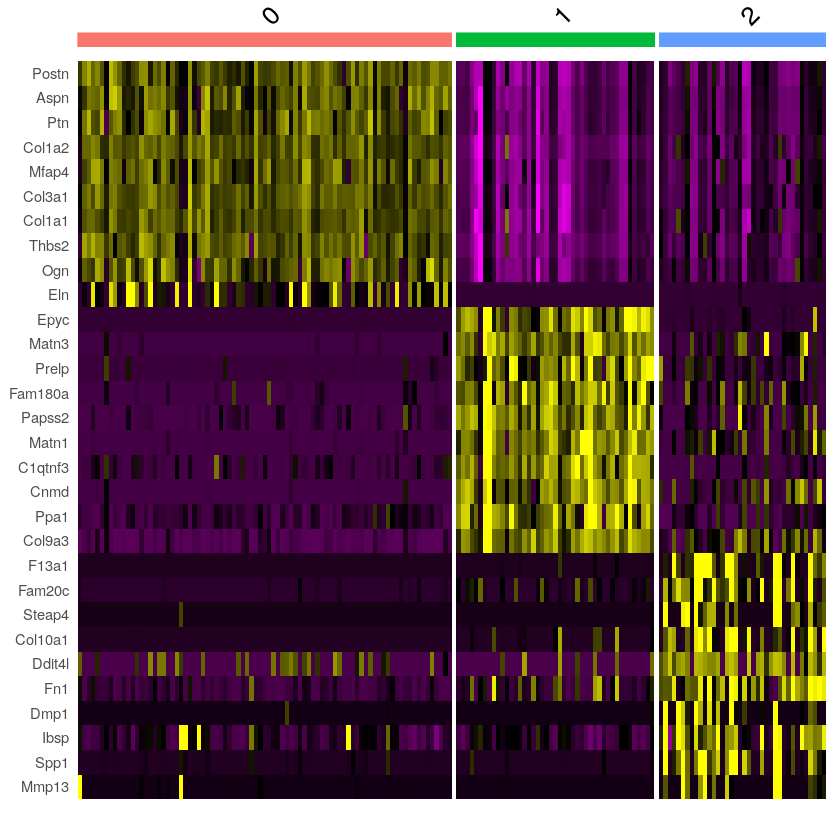

In [33]:
top10 <- osx.markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)
DoHeatmap(osx, features = top10$gene) + NoLegend()

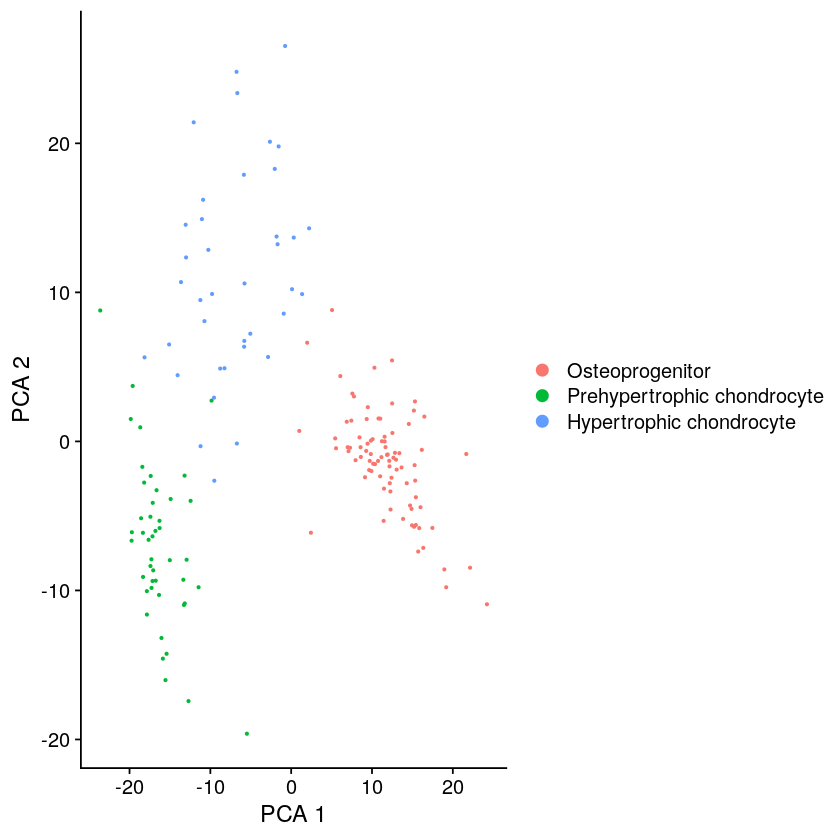

In [39]:
new.cluster.ids <- c("Osteoprogenitor", "Prehypertrophic chondrocyte", "Hypertrophic chondrocyte")
names(new.cluster.ids) <- levels(osx)
osx <- RenameIdents(osx, new.cluster.ids)

DimPlot(osx, reduction = "pca", label = FALSE, pt.size = 0.5) + xlab("PCA 1") + ylab("PCA 2")

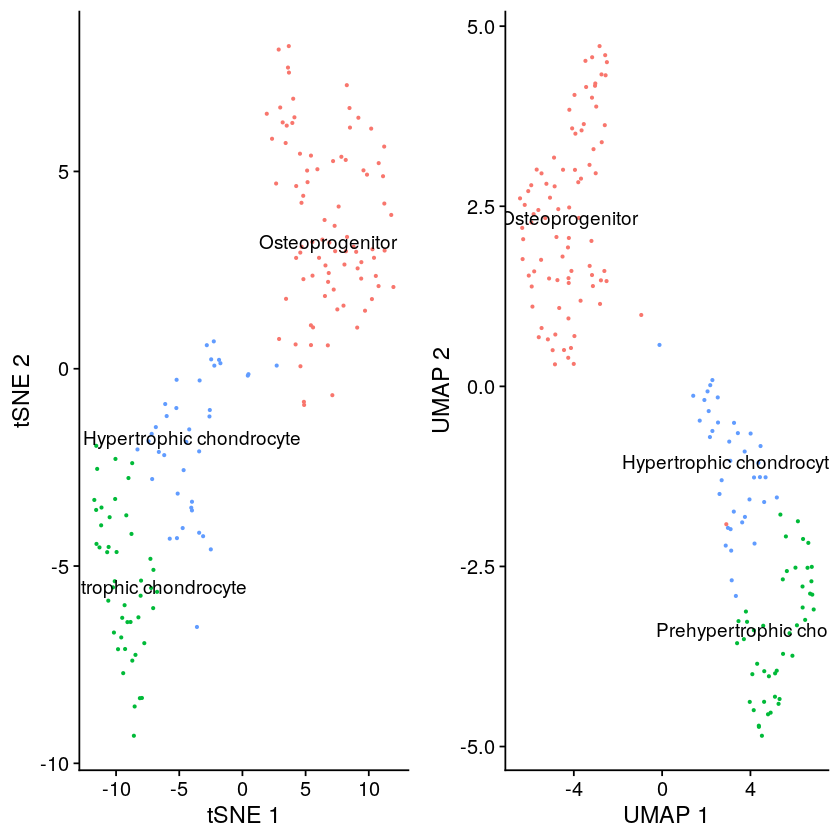

In [40]:
p1 <- DimPlot(osx, reduction = "tsne", label = TRUE, pt.size = 0.5) + xlab("tSNE 1") + ylab("tSNE 2") + NoLegend()
p2 <- DimPlot(osx, reduction = "umap", label = TRUE, pt.size = 0.5) + xlab("UMAP 1") + ylab("UMAP 2") + NoLegend()

plot_grid(p1, p2)

In [16]:
Identity <- Idents(osx)
IdentityDF <- as.data.frame(Identity)

osx <- AddMetaData(osx, IdentityDF)
head(osx@meta.data)

,Cells,Origin,CellType,Organism,Tech,is_cell_control,total_features_by_counts,log10_total_features_by_counts,total_counts,log10_total_counts,⋯,nCount_RNA,nFeature_RNA,percent.mito,S.Score,G2M.Score,Phase,old.ident,RNA_snn_res.0.5,seurat_clusters,Identity
,<fct>,<fct>,<fct>,<fct>,<fct>,<lgl>,<int>,<dbl>,<int>,<dbl>,⋯,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<fct>,<fct>,<fct>,<fct>,<fct>
ERR3427950,ERR3427950,Tibia,Osx-GFP+,Mouse,SMART-Seq2,FALSE,7457,3.872622,286985,5.457861,⋯,286985,7457,0.011176198,0.23812094,-0.10942807,S,SingleCellExperiment,0,0,Osteoprogenitor
ERR3427951,ERR3427951,Tibia,Osx-GFP+,Mouse,SMART-Seq2,FALSE,7599,3.880814,531757,5.725714,⋯,531757,7599,0.005401442,-0.14485951,-0.11362718,G1,SingleCellExperiment,1,1,Prehypertrophic chondrocyte
ERR3427952,ERR3427952,Tibia,Osx-GFP+,Mouse,SMART-Seq2,FALSE,6498,3.812847,410574,5.613393,⋯,410574,6498,0.007615103,-0.10180711,-0.08172055,G1,SingleCellExperiment,0,0,Osteoprogenitor
ERR3427953,ERR3427953,Tibia,Osx-GFP+,Mouse,SMART-Seq2,FALSE,5211,3.717004,264937,5.423144,⋯,264937,5211,0.009641769,-0.22841431,-0.08248695,G1,SingleCellExperiment,2,2,Hypertrophic chondrocyte
ERR3427954,ERR3427954,Tibia,Osx-GFP+,Mouse,SMART-Seq2,FALSE,5869,3.768638,391436,5.592662,⋯,391436,5869,0.007520422,-0.09319376,-0.07690033,G1,SingleCellExperiment,2,2,Hypertrophic chondrocyte
ERR3427955,ERR3427955,Tibia,Osx-GFP+,Mouse,SMART-Seq2,FALSE,6006,3.778658,482848,5.683811,⋯,482848,6006,0.005494778,-0.13696142,-0.12655589,G1,SingleCellExperiment,0,0,Osteoprogenitor


In [17]:
colnames(osx@meta.data)

[1] "Cells"                                         
 [2] "Origin"                                        
 [3] "CellType"                                      
 [4] "Organism"                                      
 [5] "Tech"                                          
 [6] "is_cell_control"                               
 [7] "total_features_by_counts"                      
 [8] "log10_total_features_by_counts"                
 [9] "total_counts"                                  
[10] "log10_total_counts"                            
[11] "pct_counts_in_top_50_features"                 
[12] "pct_counts_in_top_100_features"                
[13] "pct_counts_in_top_200_features"                
[14] "pct_counts_in_top_500_features"                
[15] "total_features_by_counts_endogenous"           
[16] "log10_total_features_by_counts_endogenous"     
[17] "total_counts_endogenous"                       
[18] "log10_total_counts_endogenous"                 
[19] "pct_counts_endogenous"                         
[20] "pct_counts_in_top_50_features_endogenous"      
[21] "pct_counts_in_top_100_features_endogenous"     
[22] "pct_counts_in_top_200_features_endogenous"     
[23] "pct_counts_in_top_500_features_endogenous"     
[24] "total_features_by_counts_feature_control"      
[25] "log10_total_features_by_counts_feature_control"
[26] "total_counts_feature_control"                  
[27] "log10_total_counts_feature_control"            
[28] "pct_counts_feature_control"                    
[29] "pct_counts_in_top_50_features_feature_control" 
[30] "pct_counts_in_top_100_features_feature_control"
[31] "pct_counts_in_top_200_features_feature_control"
[32] "pct_counts_in_top_500_features_feature_control"
[33] "total_features_by_counts_Mt"                   
[34] "log10_total_features_by_counts_Mt"             
[35] "total_counts_Mt"                               
[36] "log10_total_counts_Mt"                         
[37] "pct_counts_Mt"                                 
[38] "pct_counts_in_top_50_features_Mt"              
[39] "pct_counts_in_top_100_features_Mt"             
[40] "pct_counts_in_top_200_features_Mt"             
[41] "pct_counts_in_top_500_features_Mt"             
[42] "outlier"                                       
[43] "nCount_RNA"                                    
[44] "nFeature_RNA"                                  
[45] "percent.mito"                                  
[46] "S.Score"                                       
[47] "G2M.Score"                                     
[48] "Phase"                                         
[49] "old.ident"                                     
[50] "RNA_snn_res.0.5"                               
[51] "seurat_clusters"                               
[52] "Identity"

In [27]:
metadata <- osx@meta.data[, c(2,3,4,5,52)]
metadata$DevTP <- "E15.5"
metadata$Author <- "Böhm"

,Origin,CellType,Organism,Tech,Identity,DevTP,Author
,<fct>,<fct>,<fct>,<fct>,<fct>,<chr>,<chr>
ERR3427950,Tibia,Osx-GFP+,Mouse,SMART-Seq2,Osteoprogenitor,E15.5,Böhm
ERR3427951,Tibia,Osx-GFP+,Mouse,SMART-Seq2,Prehypertrophic chondrocyte,E15.5,Böhm
ERR3427952,Tibia,Osx-GFP+,Mouse,SMART-Seq2,Osteoprogenitor,E15.5,Böhm
ERR3427953,Tibia,Osx-GFP+,Mouse,SMART-Seq2,Hypertrophic chondrocyte,E15.5,Böhm
ERR3427954,Tibia,Osx-GFP+,Mouse,SMART-Seq2,Hypertrophic chondrocyte,E15.5,Böhm
ERR3427955,Tibia,Osx-GFP+,Mouse,SMART-Seq2,Osteoprogenitor,E15.5,Böhm


In [31]:
metadata <- metadata[, c(3,1,2,5,6,4,7)]

In [33]:
head(metadata)

,Organism,Origin,CellType,Identity,DevTP,Tech,Author
,<fct>,<fct>,<fct>,<fct>,<chr>,<fct>,<chr>
ERR3427950,Mouse,Tibia,Osx-GFP+,Osteoprogenitor,E15.5,SMART-Seq2,Böhm
ERR3427951,Mouse,Tibia,Osx-GFP+,Prehypertrophic chondrocyte,E15.5,SMART-Seq2,Böhm
ERR3427952,Mouse,Tibia,Osx-GFP+,Osteoprogenitor,E15.5,SMART-Seq2,Böhm
ERR3427953,Mouse,Tibia,Osx-GFP+,Hypertrophic chondrocyte,E15.5,SMART-Seq2,Böhm
ERR3427954,Mouse,Tibia,Osx-GFP+,Hypertrophic chondrocyte,E15.5,SMART-Seq2,Böhm
ERR3427955,Mouse,Tibia,Osx-GFP+,Osteoprogenitor,E15.5,SMART-Seq2,Böhm


In [26]:
saveRDS(osx, file = "Bohm_annotated.Rds")